### Importing necessary libearies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

### Reading the data

In [2]:
data = pd.read_csv(r"C:\Users\arund\Downloads\Wine_clust  (1).csv")
data.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


### Exploratory Data analysis

In [3]:
data.shape

(178, 13)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Alcohol               178 non-null    float64
 1   Malic_Acid            178 non-null    float64
 2   Ash                   178 non-null    float64
 3   Ash_Alcanity          178 non-null    float64
 4   Magnesium             178 non-null    int64  
 5   Total_Phenols         178 non-null    float64
 6   Flavanoids            178 non-null    float64
 7   Nonflavanoid_Phenols  178 non-null    float64
 8   Proanthocyanins       178 non-null    float64
 9   Color_Intensity       178 non-null    float64
 10  Hue                   178 non-null    float64
 11  OD280                 178 non-null    float64
 12  Proline               178 non-null    int64  
dtypes: float64(11), int64(2)
memory usage: 18.2 KB


In [5]:
data.dtypes

Alcohol                 float64
Malic_Acid              float64
Ash                     float64
Ash_Alcanity            float64
Magnesium                 int64
Total_Phenols           float64
Flavanoids              float64
Nonflavanoid_Phenols    float64
Proanthocyanins         float64
Color_Intensity         float64
Hue                     float64
OD280                   float64
Proline                   int64
dtype: object

In [6]:
data.describe()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


In [7]:
data.columns

Index(['Alcohol', 'Malic_Acid', 'Ash', 'Ash_Alcanity', 'Magnesium',
       'Total_Phenols', 'Flavanoids', 'Nonflavanoid_Phenols',
       'Proanthocyanins', 'Color_Intensity', 'Hue', 'OD280', 'Proline'],
      dtype='object')

In [8]:
# Correlation between different features

corr = data.corr(method='pearson')

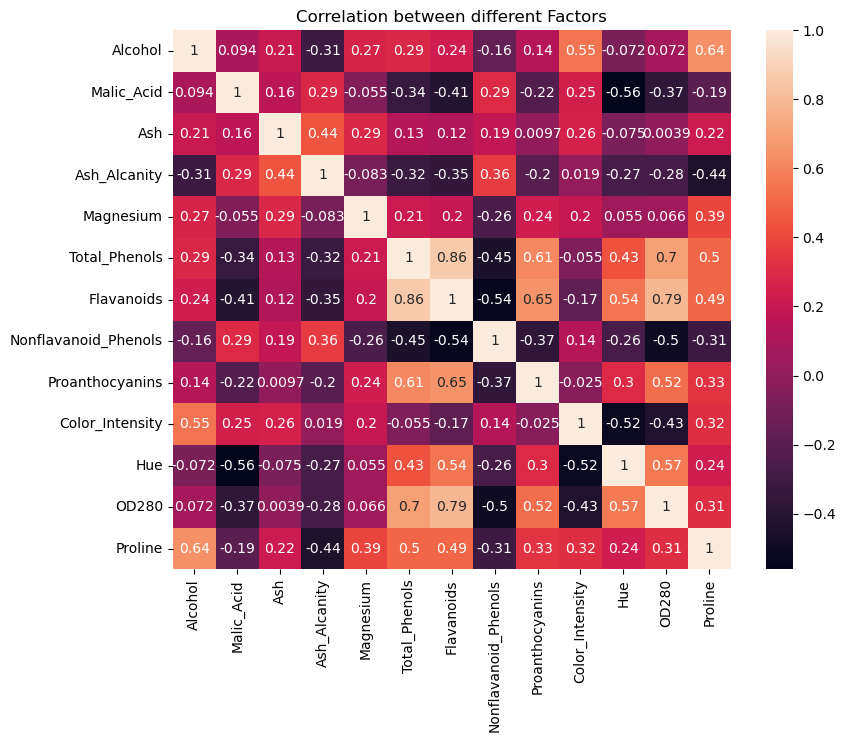

In [9]:
plt.figure(figsize=(9,7))

sns.heatmap(data.corr(),annot=True).set(title='Correlation between different Factors')

plt.show()

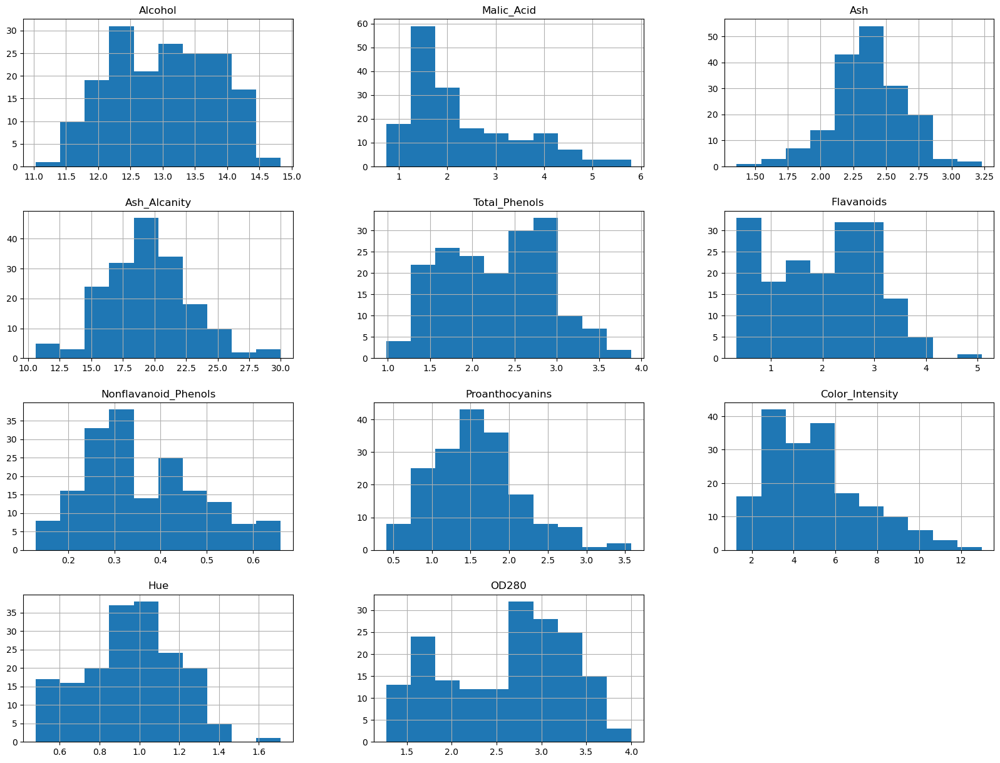

In [10]:
freqgraph = data.select_dtypes(include='float64')
freqgraph.hist(figsize=(20,15));

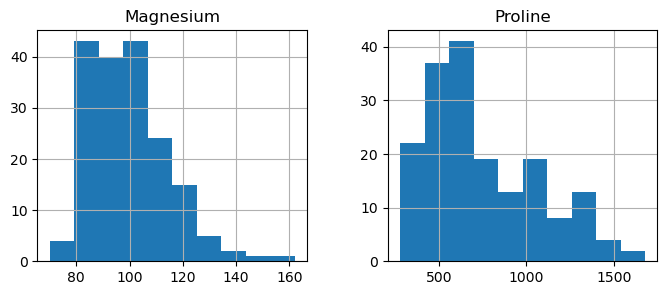

In [11]:
freqgraph = data.select_dtypes(include='int64')
freqgraph.hist(figsize=(8,3));

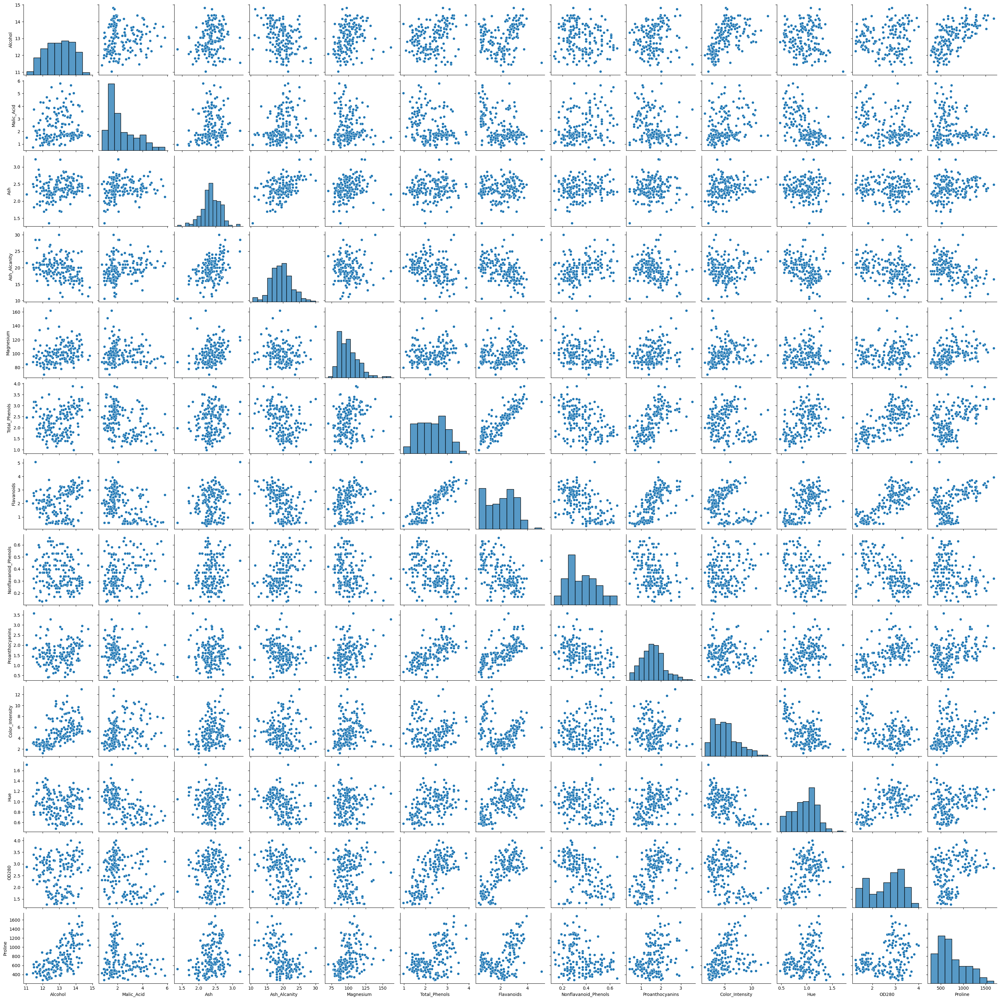

In [12]:
sns.pairplot(data)

## Preprocessing

In [13]:
data.isnull().sum()

Alcohol                 0
Malic_Acid              0
Ash                     0
Ash_Alcanity            0
Magnesium               0
Total_Phenols           0
Flavanoids              0
Nonflavanoid_Phenols    0
Proanthocyanins         0
Color_Intensity         0
Hue                     0
OD280                   0
Proline                 0
dtype: int64

### Handling Outliers

In [13]:
num_cols = ['Alcohol', 'Malic_Acid', 'Ash', 'Ash_Alcanity', 'Magnesium',
       'Total_Phenols', 'Flavanoids', 'Nonflavanoid_Phenols',
       'Proanthocyanins', 'Color_Intensity', 'Hue', 'OD280', 'Proline']

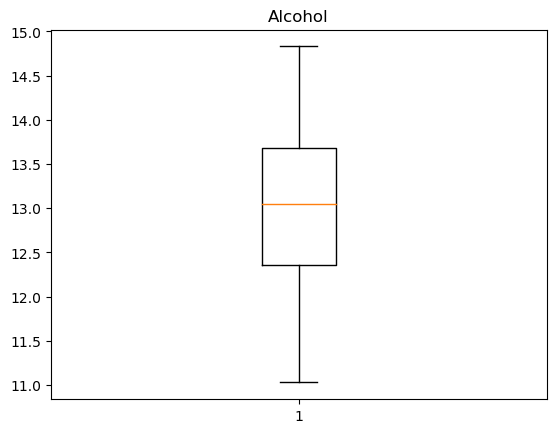

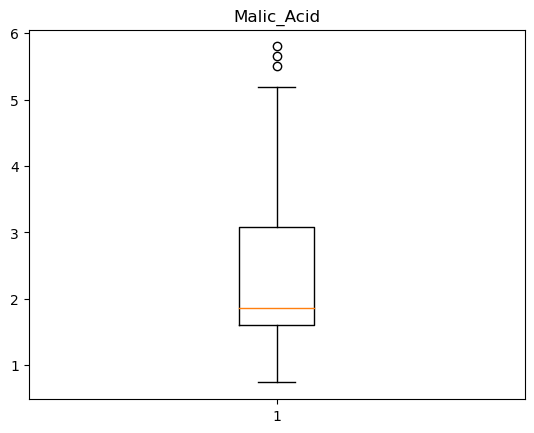

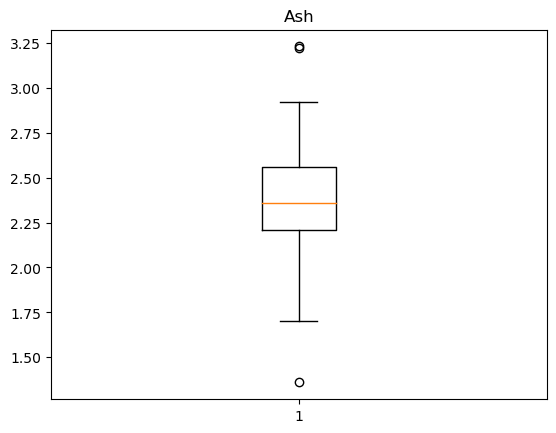

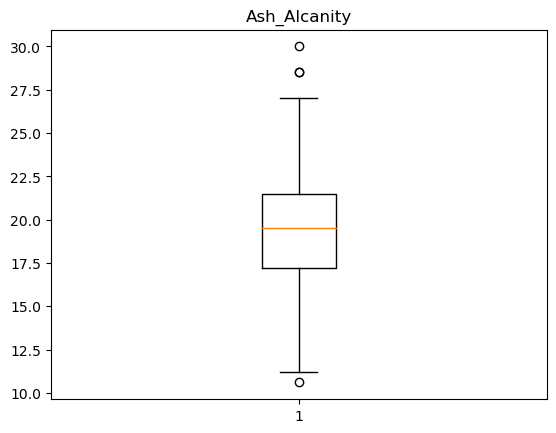

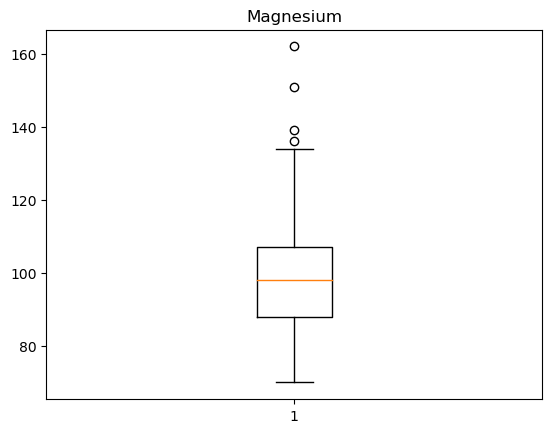

...

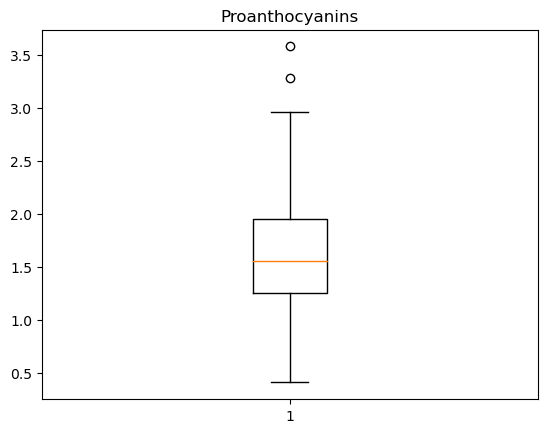

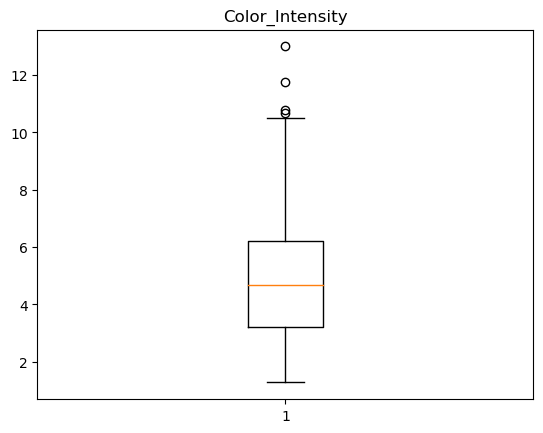

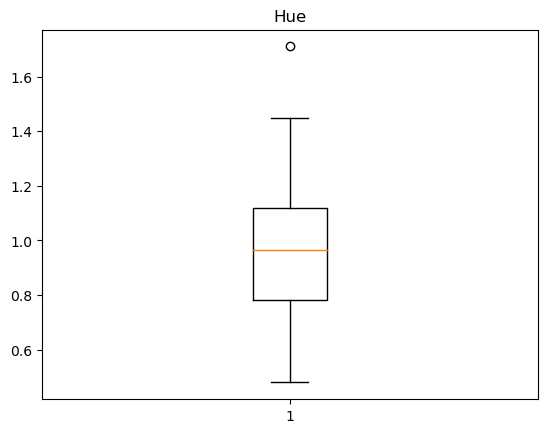

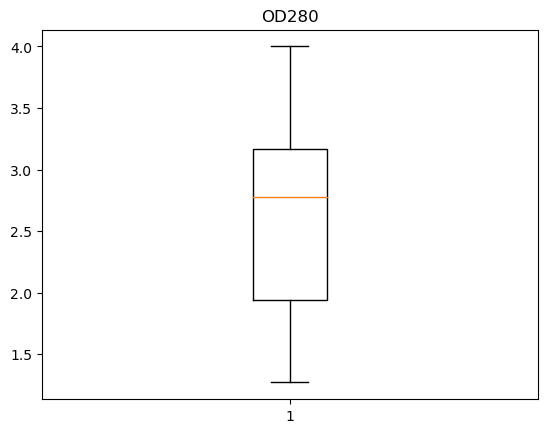

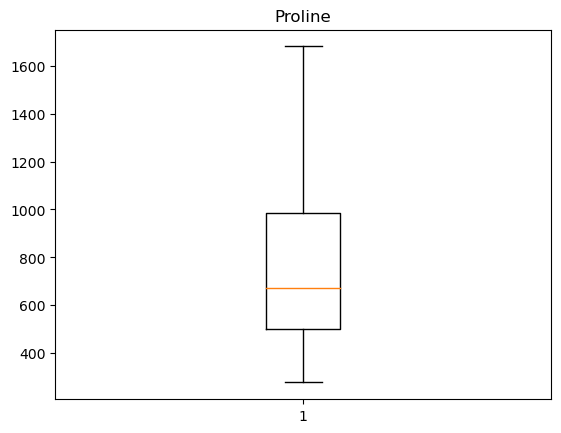

In [14]:
for i in num_cols:
    plt.figure()
    plt.boxplot(data[i])
    plt.title(i)

From above boxplot we can see that features like Malic_Acid, Ash,Ash_Alcanity, Magnesium, Proanthocyanins ,Color_Intensity and
Hue have outliers.

#### Outlier removal using IQR method

In [15]:
# 1) Malic_Acid

Q1 = np.percentile(data['Malic_Acid'],25,method='midpoint')
Q2 = np.percentile(data['Malic_Acid'],50,method='midpoint')
Q3 = np.percentile(data['Malic_Acid'],75,method='midpoint')

print("Q1 is ",Q1)
print("Q2 is ",Q2)
print("Q3 is ",Q3)

Q1 is  1.605
Q2 is  1.8650000000000002
Q3 is  3.065


In [16]:
IQR = Q3 - Q1
IQR

1.46

In [17]:
low_lim = Q1-IQR*1.5
up_lim = Q3+1.5*IQR

print("lower limit is ",low_lim)
print("upper limit is ",up_lim)

lower limit is  -0.585
upper limit is  5.255


In [18]:
outlier=[]
for x in data['Malic_Acid']:
    if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[5.8, 5.51, 5.65]

In [19]:
data['Malic_Acid'] = data['Malic_Acid'].clip(lower=low_lim , upper=up_lim)

outlier=[]
for x in data['Malic_Acid']:
     if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[]

In [20]:
# 2) Ash

Q1 = np.percentile(data['Ash'],25,method='midpoint')
Q2 = np.percentile(data['Ash'],50,method='midpoint')
Q3 = np.percentile(data['Ash'],75,method='midpoint')

print("Q1 is ",Q1)
print("Q2 is ",Q2)
print("Q3 is ",Q3)


Q1 is  2.21
Q2 is  2.36
Q3 is  2.5549999999999997


In [21]:
IQR = Q3 - Q1
IQR

0.34499999999999975

In [22]:
low_lim = Q1-IQR*1.5
up_lim = Q3+1.5*IQR

print("lower limit is ",low_lim)
print("upper limit is ",up_lim)

lower limit is  1.6925000000000003
upper limit is  3.0724999999999993


In [23]:
outlier=[]
for x in data['Ash']:
    if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[3.22, 1.36, 3.23]

In [24]:
data['Ash'] = data['Ash'].clip(lower=low_lim , upper=up_lim)

outlier=[]
for x in data['Ash']:
     if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[]

In [25]:
# 3) Ash_Alcanity

Q1 = np.percentile(data['Ash_Alcanity'],25,method='midpoint')
Q2 = np.percentile(data['Ash_Alcanity'],50,method='midpoint')
Q3 = np.percentile(data['Ash_Alcanity'],75,method='midpoint')

print("Q1 is ",Q1)
print("Q2 is ",Q2)
print("Q3 is ",Q3)


Q1 is  17.2
Q2 is  19.5
Q3 is  21.5


In [26]:
IQR = Q3 - Q1
IQR

4.300000000000001

In [27]:
low_lim = Q1-IQR*1.5
up_lim = Q3+1.5*IQR

print("lower limit is ",low_lim)
print("upper limit is ",up_lim)

lower limit is  10.749999999999998
upper limit is  27.950000000000003


In [28]:
outlier=[]
for x in data['Ash_Alcanity']:
    if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[10.6, 30.0, 28.5, 28.5]

In [29]:
data['Ash_Alcanity'] = data['Ash_Alcanity'].clip(lower=low_lim , upper=up_lim)

outlier=[]
for x in data['Ash_Alcanity']:
     if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[]

In [30]:
# 4) Magnesium

Q1 = np.percentile(data['Magnesium'],25,method='midpoint')
Q2 = np.percentile(data['Magnesium'],50,method='midpoint')
Q3 = np.percentile(data['Magnesium'],75,method='midpoint')

print("Q1 is ",Q1)
print("Q2 is ",Q2)
print("Q3 is ",Q3)


Q1 is  88.0
Q2 is  98.0
Q3 is  107.0


In [31]:
IQR = Q3 - Q1
IQR

19.0

In [32]:
low_lim = Q1-IQR*1.5
up_lim = Q3+1.5*IQR

print("lower limit is ",low_lim)
print("upper limit is ",up_lim)

lower limit is  59.5
upper limit is  135.5


In [33]:
outlier=[]
for x in data['Magnesium']:
    if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[151, 139, 136, 162]

In [34]:
data['Magnesium'] = data['Magnesium'].clip(lower=low_lim , upper=up_lim)

outlier=[]
for x in data['Magnesium']:
     if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[]

In [35]:
# 5) Proanthocyanins

Q1 = np.percentile(data['Proanthocyanins'],25,method='midpoint')
Q2 = np.percentile(data['Proanthocyanins'],50,method='midpoint')
Q3 = np.percentile(data['Proanthocyanins'],75,method='midpoint')

print("Q1 is ",Q1)
print("Q2 is ",Q2)
print("Q3 is ",Q3)


Q1 is  1.25
Q2 is  1.5550000000000002
Q3 is  1.95


In [36]:
IQR = Q3 - Q1
IQR

0.7

In [37]:
low_lim = Q1-IQR*1.5
up_lim = Q3+1.5*IQR

print("lower limit is ",low_lim)
print("upper limit is ",up_lim)

lower limit is  0.20000000000000018
upper limit is  3.0


In [38]:
outlier=[]
for x in data['Proanthocyanins']:
    if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[3.28, 3.58]

In [39]:
data['Proanthocyanins'] = data['Proanthocyanins'].clip(lower=low_lim , upper=up_lim)

outlier=[]
for x in data['Proanthocyanins']:
     if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[]

In [40]:
# 6) Color_Intensity

Q1 = np.percentile(data['Color_Intensity'],25,method='midpoint')
Q2 = np.percentile(data['Color_Intensity'],50,method='midpoint')
Q3 = np.percentile(data['Color_Intensity'],75,method='midpoint')

print("Q1 is ",Q1)
print("Q2 is ",Q2)
print("Q3 is ",Q3)


Q1 is  3.23
Q2 is  4.6899999999999995
Q3 is  6.2


In [41]:
IQR = Q3 - Q1
IQR

2.97

In [42]:
low_lim = Q1-IQR*1.5
up_lim = Q3+1.5*IQR

print("lower limit is ",low_lim)
print("upper limit is ",up_lim)

lower limit is  -1.225
upper limit is  10.655000000000001


In [43]:
outlier=[]
for x in data['Color_Intensity']:
    if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[10.8, 13.0, 11.75, 10.68]

In [44]:
data['Color_Intensity'] = data['Color_Intensity'].clip(lower=low_lim , upper=up_lim)

outlier=[]
for x in data['Color_Intensity']:
     if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[]

In [45]:
# 7) Hue


Q1 = np.percentile(data['Hue'],25,method='midpoint')
Q2 = np.percentile(data['Hue'],50,method='midpoint')
Q3 = np.percentile(data['Hue'],75,method='midpoint')

print("Q1 is ",Q1)
print("Q2 is ",Q2)
print("Q3 is ",Q3)


Q1 is  0.785
Q2 is  0.965
Q3 is  1.12


In [46]:
IQR = Q3 - Q1
IQR

0.3350000000000001

In [47]:
low_lim = Q1-IQR*1.5
up_lim = Q3+1.5*IQR

print("lower limit is ",low_lim)
print("upper limit is ",up_lim)

lower limit is  0.28249999999999986
upper limit is  1.6225000000000003


In [48]:
outlier=[]
for x in data['Hue']:
    if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[1.71]

In [49]:
data['Hue'] = data['Hue'].clip(lower=low_lim , upper=up_lim)

outlier=[]
for x in data['Hue']:
     if((x > up_lim) or (x < low_lim)):
        outlier.append(x)

outlier

[]

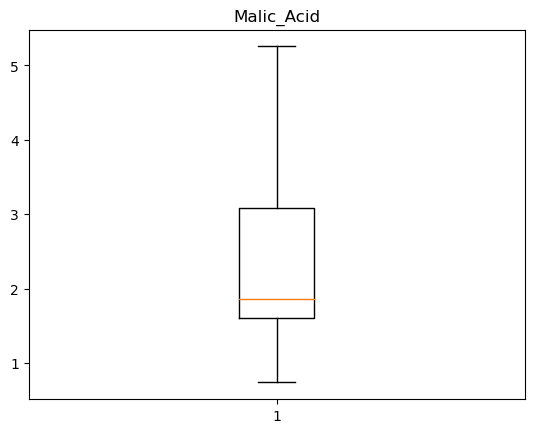

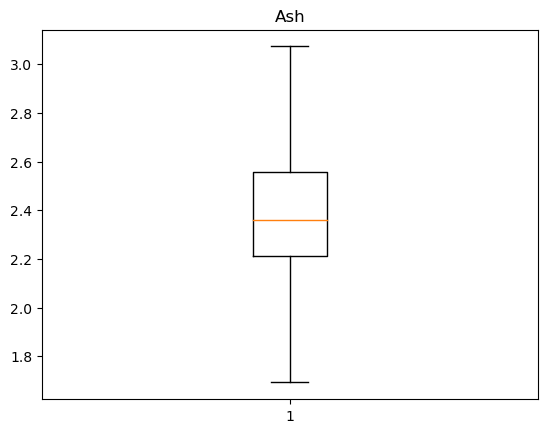

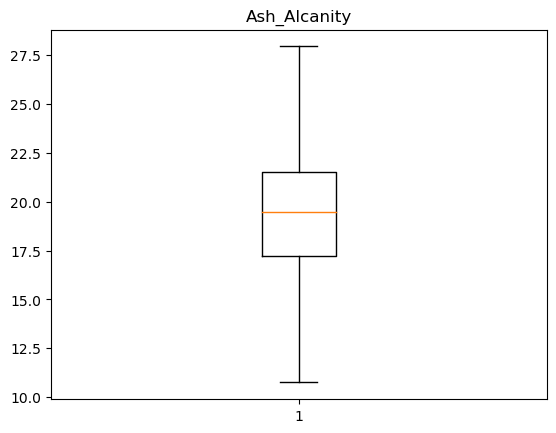

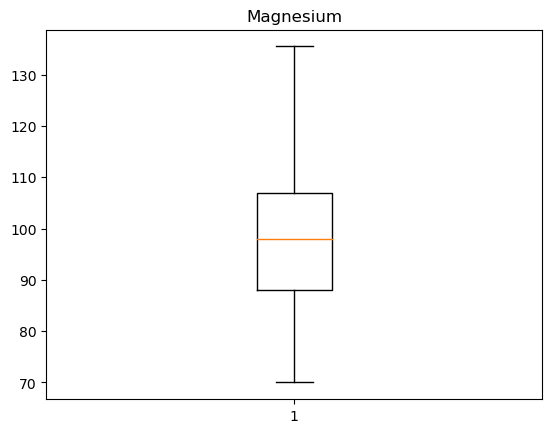

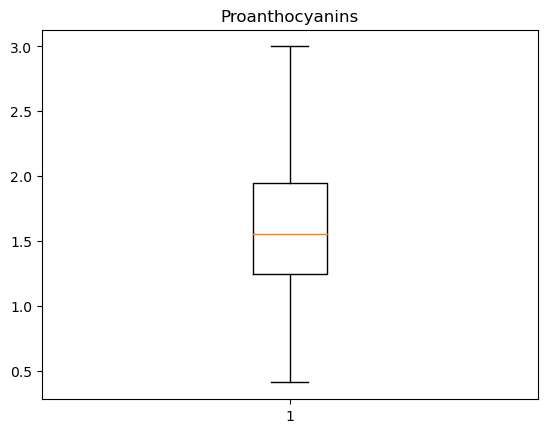

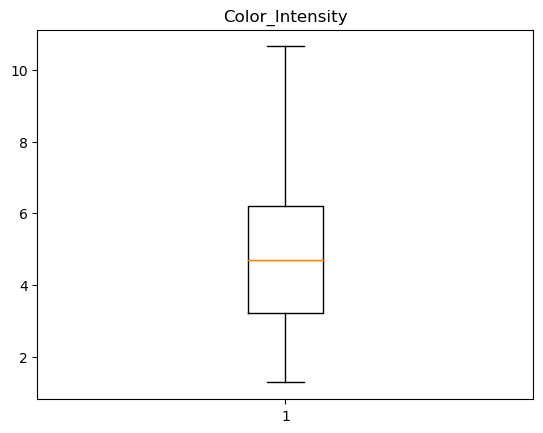

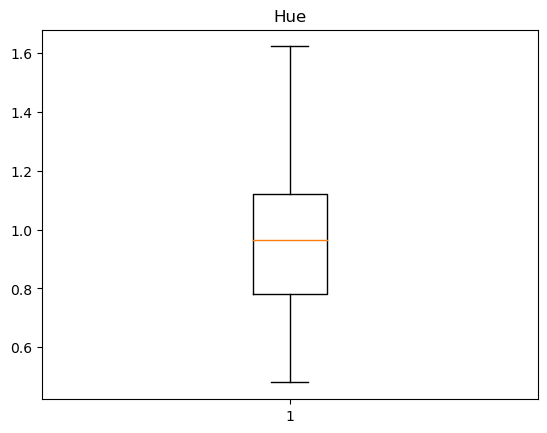

In [50]:
num_cols2 = ['Malic_Acid','Ash','Ash_Alcanity','Magnesium','Proanthocyanins','Color_Intensity','Hue']

for i in num_cols2:
    plt.figure()
    plt.boxplot(data[i])
    plt.title(i)

#### Scaling the data

In [52]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
X = scalar.fit_transform(data)

## K-Means Clustering

In [53]:
from sklearn.cluster import KMeans

#### Finding optimum number of clusters using Elbow method

In [54]:
wcss =[]
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=300,n_init=10,random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
wcss

[2314.000000000001,
 1654.7713548974607,
 1265.9049355818315,
 1166.0303030065775,
 1104.0754427703991,
 1030.3846827277039,
 976.9903695769773,
 935.6128764207062,
 891.7109689795896,
 856.6193768615885]

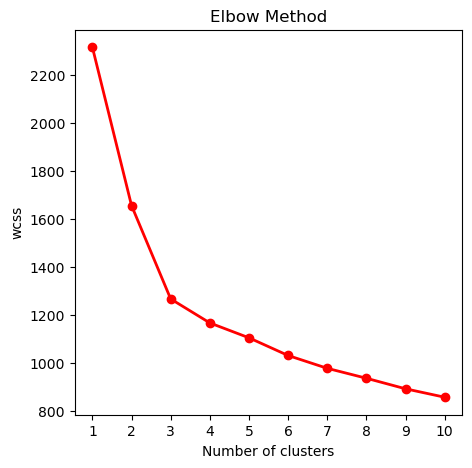

In [55]:
plt.figure(figsize=(5,5))
plt.plot(range(1,11),wcss,linewidth=2,color='red',marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.title('Elbow Method')
plt.xticks(np.arange(1,11,1))
plt.show()

The optimum number of clusters = 3

In [56]:
kmeans = KMeans(n_clusters = 3 , init = 'k-means++', max_iter=300 ,
                  n_init =10 , random_state =42)
kmeans.fit(X)

cluster_labels = kmeans.predict(X)

cluster_labels

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

In [57]:
data1 = data.copy()

In [58]:
data1['cluster_km'] = cluster_labels
data1.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,cluster_km
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,2
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,2
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,2
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,2
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,2


In [59]:
data1['cluster_km'].value_counts()

cluster_km
0    65
2    62
1    51
Name: count, dtype: int64

In [60]:
kmeans.cluster_centers_

array([[-0.92607185, -0.40243396, -0.49606186,  0.17655379, -0.52262273,
        -0.07598265,  0.02081257, -0.03353357,  0.05239714, -0.91616034,
         0.46115869,  0.27076419, -0.75384618],
       [ 0.16490746,  0.88122505,  0.19403083,  0.53777086, -0.06103856,
        -0.97933029, -1.21524764,  0.72606354, -0.79087061,  0.94339602,
        -1.17051157, -1.29241163, -0.40708796],
       [ 0.83523208, -0.30297211,  0.36045885, -0.62745662,  0.59812007,
         0.88523736,  0.97781956, -0.56208965,  0.59562237,  0.18447137,
         0.47936734,  0.77924711,  1.12518529]])

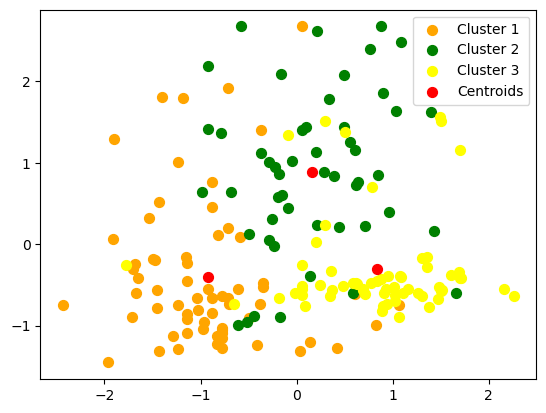

In [61]:
plt.scatter(X[cluster_labels==0, 0], X[cluster_labels==0, 1],c='orange',s=50,label='Cluster 1')
plt.scatter(X[cluster_labels==1, 0], X[cluster_labels==1, 1],c='green',s=50,label='Cluster 2')
plt.scatter(X[cluster_labels==2, 0], X[cluster_labels==2, 1],c='yellow',s=50,label='Cluster 3')
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],c='red',s=50, label='Centroids' )
plt.legend()
plt.show()

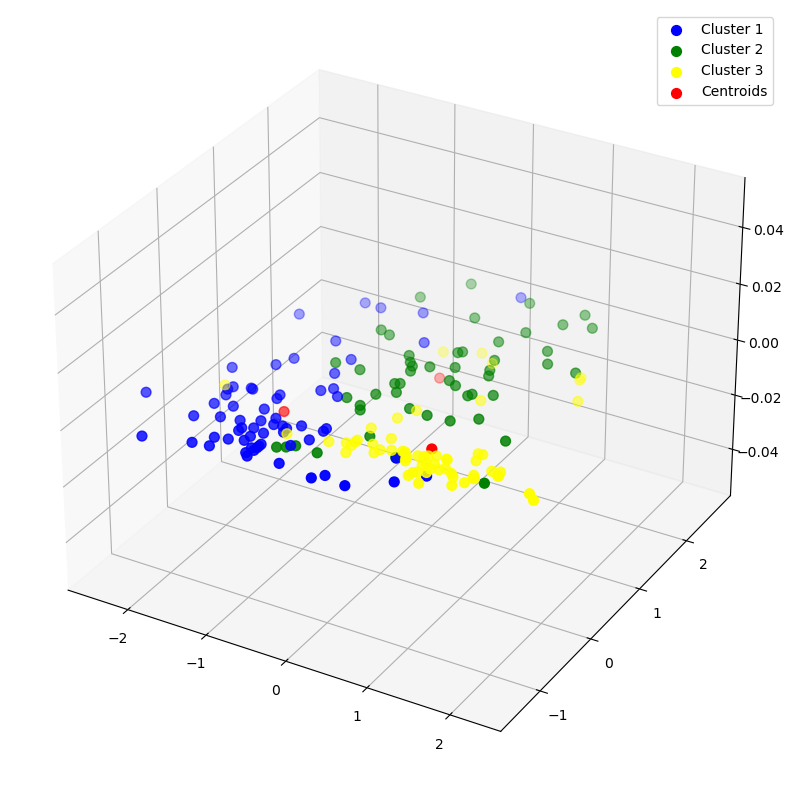

In [62]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(X[cluster_labels==0, 0], X[cluster_labels==0, 1],c='blue',s=50,label='Cluster 1')
plt.scatter(X[cluster_labels==1, 0], X[cluster_labels==1, 1],c='green',s=50,label='Cluster 2')
plt.scatter(X[cluster_labels==2, 0], X[cluster_labels==2, 1],c='yellow',s=50,label='Cluster 3')
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],c='red',s=50, label='Centroids' )
plt.legend()
plt.show()

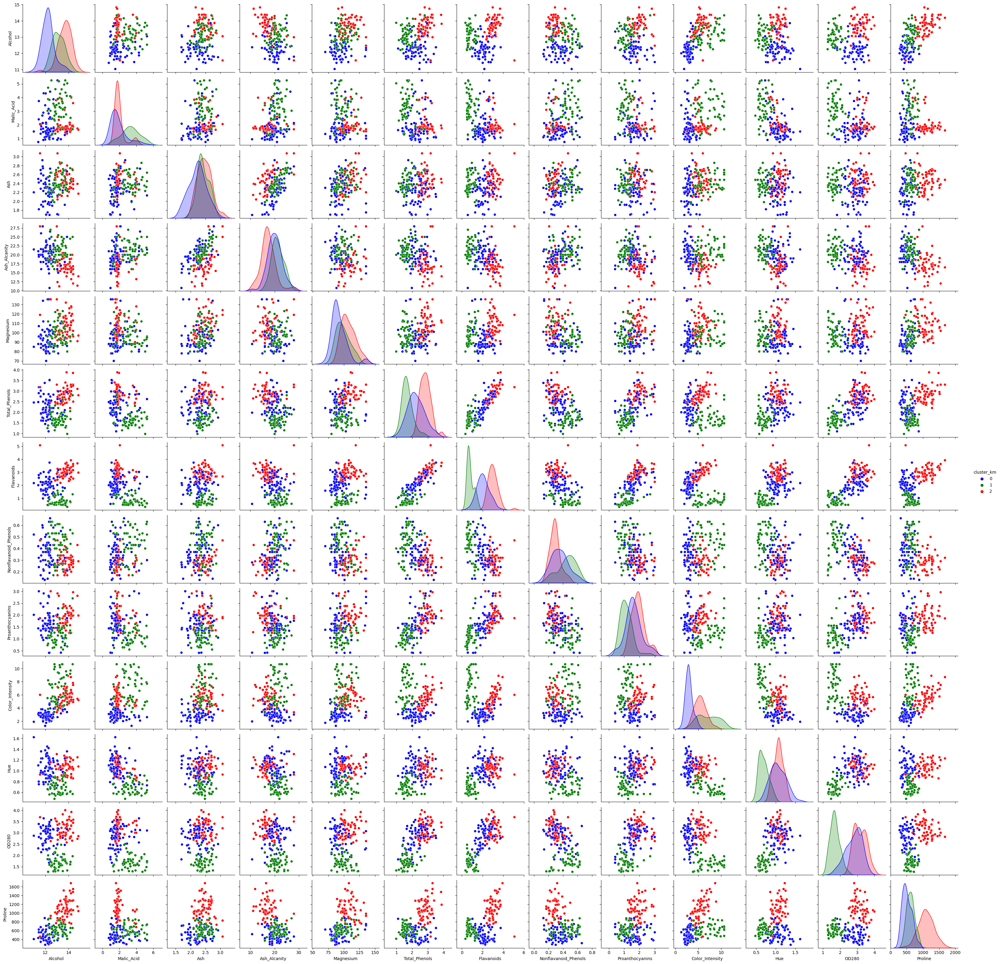

In [63]:
sns.pairplot(data1,hue='cluster_km',palette =['blue','green','red'])

# Agglomerative Clustering

##### Finding the optimum number of clusters using Dendrogram

In [64]:
from scipy.cluster.hierarchy import linkage , dendrogram

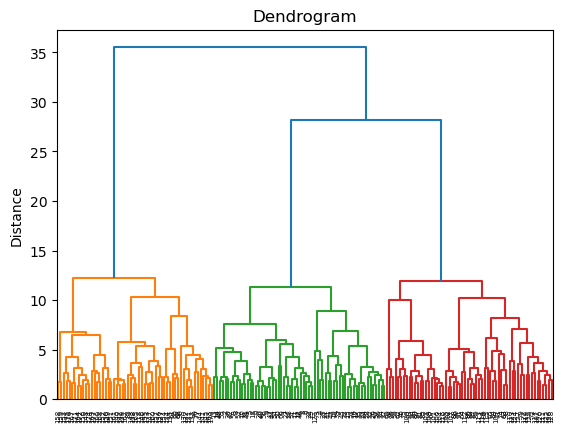

In [65]:
mergings = linkage(X, method='ward')
dendrogram(mergings)
plt.title('Dendrogram')
plt.ylabel('Distance')
plt.show()

In [66]:
from scipy.cluster.hierarchy import fcluster

max_d = 27
clusters = fcluster(mergings , max_d , criterion='distance')
print("Optimum Number of clusters : " , len(set(clusters)))

Optimum Number of clusters :  3


In [67]:
from sklearn.cluster import AgglomerativeClustering
agg = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
ag_cluster_labels = agg.fit_predict(X)

In [68]:
ag_cluster_labels

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 1, 1, 1, 1,
       2, 1, 0, 1, 0, 1, 1, 2, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0], dtype=int64)

In [69]:
data2 = data.copy()

In [70]:
data2['cluster_agglo'] = ag_cluster_labels
data2.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,cluster_agglo
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,2
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,2
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,2
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,2
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,2


In [71]:
data2['cluster_agglo'].value_counts()

cluster_agglo
2    62
1    60
0    56
Name: count, dtype: int64

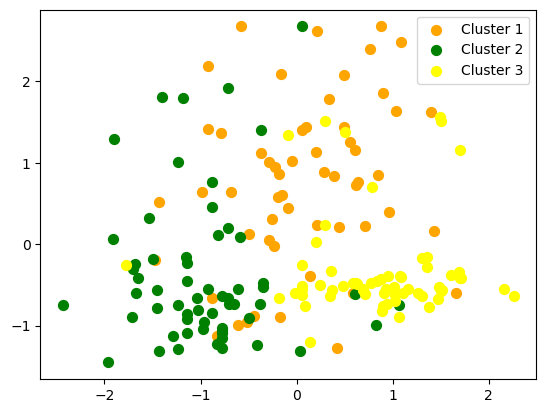

In [72]:
plt.scatter(X[ag_cluster_labels==0, 0], X[ag_cluster_labels==0, 1],c='orange',s=50,label='Cluster 1')
plt.scatter(X[ag_cluster_labels==1, 0], X[ag_cluster_labels==1, 1],c='green',s=50,label='Cluster 2')
plt.scatter(X[ag_cluster_labels==2, 0], X[ag_cluster_labels==2, 1],c='yellow',s=50,label='Cluster 3')
plt.legend()
plt.show()

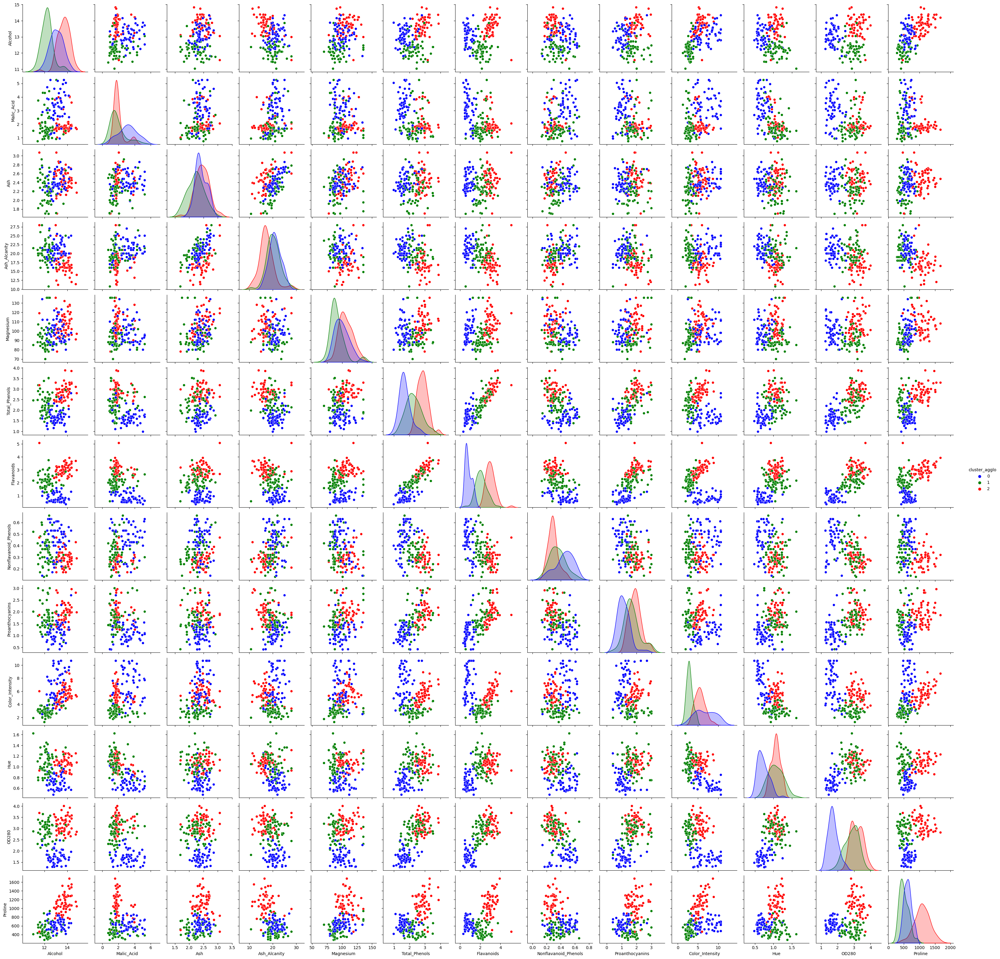

In [73]:
sns.pairplot(data2,hue='cluster_agglo',palette =['blue','green','red'])

## DBSCAN Clustering

We need to optimise two parameters in DBSCAN, _eps_ and _min_samples_

Lets use NearestNeighbors to find the optimal _eps_ value

In [74]:
from sklearn.neighbors import NearestNeighbors

In [75]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=20)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)

Lets plot the distances of each point in ascending order of the distance, elbow point will give us the samller range for optimal _eps_ value.

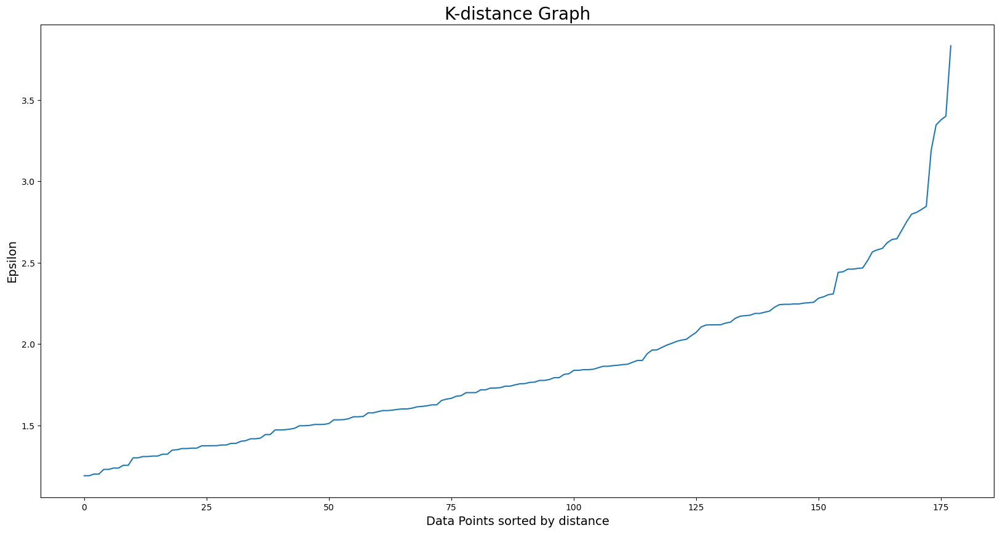

In [76]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

The optimum value of epsilon is at the point of maximum curvature in the K-Distance Graph, here it is around 2.85

In [87]:
from sklearn.cluster import DBSCAN
dbscan_opt=DBSCAN(eps=2.85,min_samples=14)
dbscan_opt.fit(X)


DBSCAN(eps=2.85, min_samples=14)

Best silhoutte score for eps=2.85 and min_samples = 14

In [88]:
data3 = data.copy()

In [89]:
data3['cluster_db']=dbscan_opt.labels_

In [90]:
data3.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,cluster_db
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,0


In [91]:
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(X,dbscan_opt.labels_)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.21845701544216875


In [92]:
data3['cluster_db'].value_counts()

cluster_db
 0    111
 1     47
-1     20
Name: count, dtype: int64

Here 0 and 1 are two different clusters and -1 is the noise.

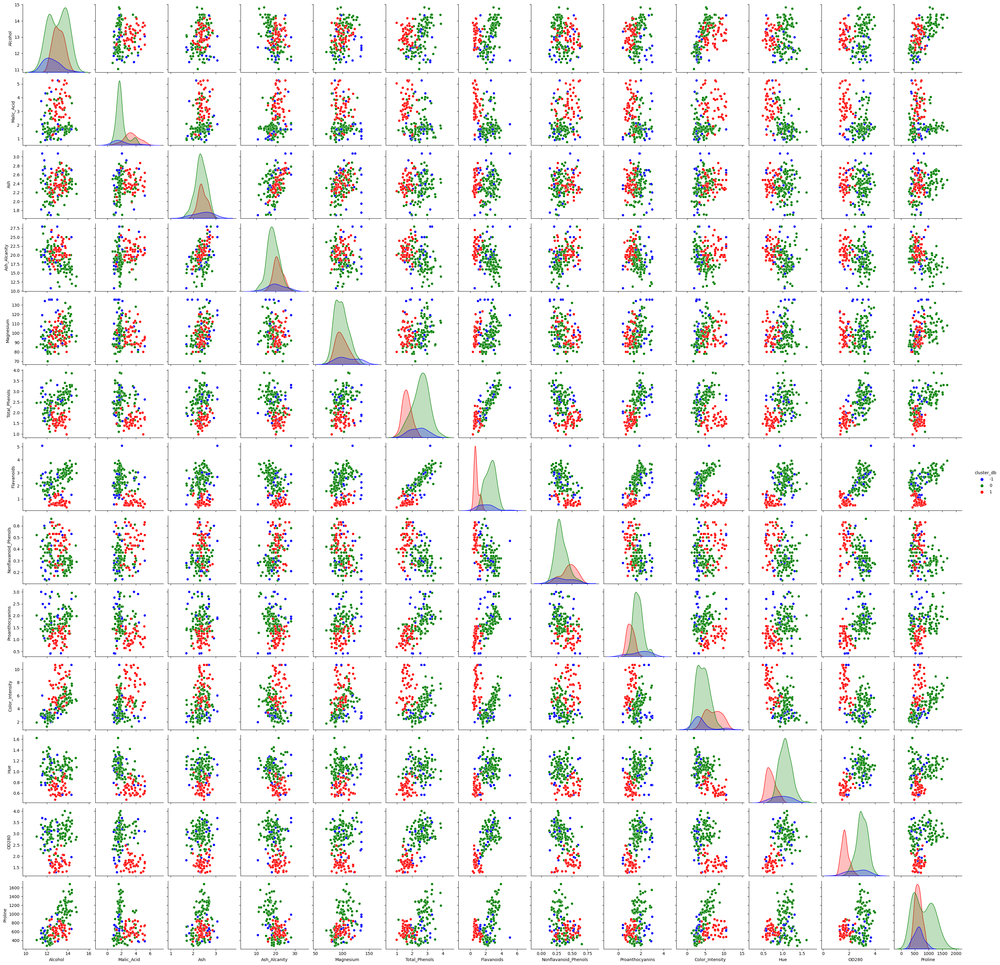

In [93]:
sns.pairplot(data3,hue='cluster_db',palette =['blue','green','red'])

In [94]:
data1['cluster_agglo'] = ag_cluster_labels
data1['cluster_db'] = dbscan_opt.labels_

In [95]:
data1.head(10)

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,cluster_km,cluster_agglo,cluster_db
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,2,2,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,2,2,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,2,2,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,2,2,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,2,2,0
5,14.20,1.76,2.45,15.2,112.0,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450,2,2,0
6,14.39,1.87,2.45,14.6,96.0,2.50,2.52,0.30,1.98,5.25,1.02,3.58,1290,2,2,0
7,14.06,2.15,2.61,17.6,121.0,2.60,2.51,0.31,1.25,5.05,1.06,3.58,1295,2,2,0
8,14.83,1.64,2.17,14.0,97.0,2.80,2.98,0.29,1.98,5.20,1.08,2.85,1045,2,2,0
9,13.86,1.35,2.27,16.0,98.0,2.98,3.15,0.22,1.85,7.22,1.01,3.55,1045,2,2,0
